### **IMPORTS & DOWNLOADS**


In [ ]:
# Core Python libraries
import os
import time
from IPython.display import clear_output, Image, display, HTML

# Scientific computing
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr

# PyTorch core
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.nn.init as init
from torch.utils.data import DataLoader, TensorDataset
from torch.utils.data import random_split
from torch.optim.lr_scheduler import ReduceLROnPlateau

# Sklearn utilities
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

# Google Colab (if running in Colab)
from google.colab import drive

#MOUNT AND R/W DRIVE
drive.mount('/content/drive')
save_path = "/content/drive/MyDrive/Weights/best_model.pth"

#GPU or CPU  device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")


#download data
if not os.path.exists("data.hdf5"):
    !gdown https://drive.google.com/uc?id=1gl5W5PexON0wBfajUTPEkd9AiEnHo4rL -O data.hdf5


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Using device: cuda


### **INITIALISE VARIABLES**

In [ ]:
# Initialize
lr = 0.00001
batch_size = 64
best_loss = float("inf")
patience_counter = 0
patience = 50

#Normalisation function

In [ ]:
def z_score_normaliser(x, dim=None):
    x = np.array(x)
    mean = np.mean(x, axis=dim, keepdims=True)
    std = np.std(x, axis=dim, keepdims=True)
    x = (x - mean) / (std + np.finfo(float).eps)  # Avoid divide-by-zero
    return x


### **LOAD DATA/PREPROCESSING/CREATE DATASET/NORMALISATION/AUGMENTATION**

In [ ]:
# Load dataset NumPy Method
# log_H2O  log_CO2  log_CH4  log_CO  log_NH3

# open hdf5
ds = xr.open_dataset("data.hdf5")

rah='log_H2O'
rahh=rah[4:]

label_names = ['log_H2O']
labels = ds[label_names]
labels_np = labels.to_array().values.T

spectra_np = ds['spectrum'].values
spectra_np = np.nan_to_num(spectra_np)  # Replace NaNs with 0
spectra_np = z_score_normaliser(spectra_np, dim=1)  # Normalize each sample

#Add slight noise for augmentation
noise_strength = 0.01
augmented_spectra = spectra_np + np.random.normal(0, noise_strength, spectra_np.shape)
augmented_labels = labels_np.copy()

# Combine original and augmented
spectra_np = np.concatenate([spectra_np, augmented_spectra], axis=0)
labels_np = np.concatenate([labels_np, augmented_labels], axis=0)

print(spectra_np.shape)
print(labels_np.shape)

train_dataset = TensorDataset(torch.Tensor(spectra_np), torch.Tensor(labels_np))
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

print(type(labels))
ds



(146226, 52)
(146226, 1)
<class 'xarray.core.dataset.Dataset'>


<xarray.Dataset> Size: 263MB
Dimensions:                 (wavelength: 52, sample: 73113, parameter: 6,
                             quartile: 3, species: 5)
Coordinates:
  * wavelength              (wavelength) float64 416B 0.55 0.7 ... 6.814 7.276
  * sample                  (sample) int64 585kB 74589 22241 ... 21258 13523
  * parameter               (parameter) <U13 312B 'planet_temp_k' ... 'log_NH3'
  * quartile                (quartile) <U2 24B 'q1' 'q2' 'q3'
  * species                 (species) <U3 60B 'H2O' 'CO2' 'CH4' 'CO' 'NH3'
Data variables: (12/22)
    bin_width               (wavelength) float64 416B ...
    spectrum                (sample, wavelength) float64 30MB 0.00383 ... 0.0...
    noise                   (sample, wavelength) float64 30MB ...
    planet_temp_k           (sample) float64 585kB ...
    log_H2O                 (sample) float64 585kB -5.09 -7.361 ... -5.493
    log_CO2                 (sample) float64 585kB ...
    ...                      ...
    planet_radius_m         (sample) float64 585kB ...
    planet_surface_gravity  (sample) float64 585kB ...
    valid_quartiles         (sample) bool 73kB ...
    parameter_quartiles     (sample, parameter, quartile) float64 11MB ...
    contributions           (sample, species, wavelength) float64 152MB ...
    clean_forward_model     (sample, wavelength) float64 30MB ...

### **VISUALISE DATA**

######################################################################
 Aundance of log_H2O in planetary atmosphere for planet 0 is -6.4848
######################################################################


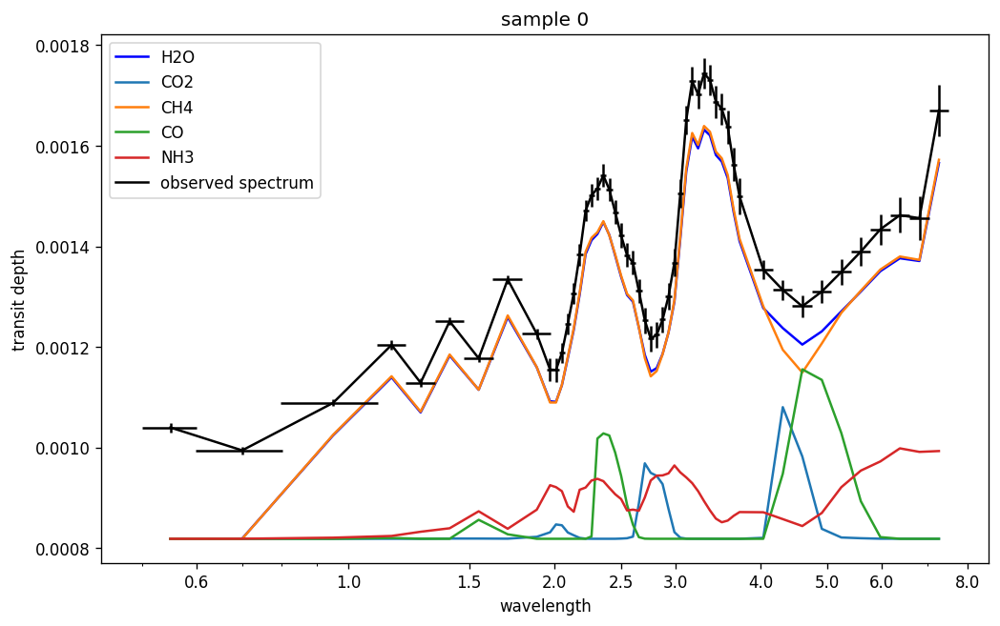

In [ ]:
i = 0

plt.figure(figsize=(10, 6), dpi=120)
plt.plot(ds['wavelength'],ds['contributions'].sel(sample=i,species=['H2O']).values.T, label='H2O', color = 'b')
plt.plot(ds['wavelength'],ds['contributions'].sel(sample=i,species=['CO2']).values.T, label='CO2')
plt.plot(ds['wavelength'],ds['contributions'].sel(sample=i,species=['CH4']).values.T, label='CH4')
plt.plot(ds['wavelength'],ds['contributions'].sel(sample=i,species=['CO']).values.T, label='CO')
plt.plot(ds['wavelength'],ds['contributions'].sel(sample=i,species=['NH3']).values.T, label='NH3')
plt.plot(ds['wavelength'],ds['spectrum'].sel(sample=i).values, "k-", label='observed spectrum')

plt.errorbar(ds['wavelength'],ds['spectrum'].sel(sample=i).values,xerr=ds['bin_width']/2, yerr=ds['noise'].sel(sample=i).values, fmt='none', color='black', )


plt.xlabel('wavelength')
plt.ylabel('transit depth')

axs = plt.gca()
axs.set_xscale('log')
axs.set_xticks([0.6, 1,1.5, 2, 2.5,3,4, 5, 6,8,])
axs.get_xaxis().set_major_formatter(plt.ScalarFormatter())

plt.title(f'sample {i}')
plt.legend()


# print the species present in the sample
s_ = rah
print("#"*70)
print(f" Aundance of {s_} in planetary atmosphere for planet {i} is {ds[s_].sel(sample=i).values:.4f}")
print("#"*70)

# 🧠 Creating the Neural Network Model

This is where we will define the architecture of the model that we are going to train



In [ ]:
class ImprovedModel(nn.Module):
    def __init__(self):
        super(ImprovedModel, self).__init__()

        # Increased layer width and depth
        self.fc1 = nn.Linear(52, 1024)
        self.bn1 = nn.BatchNorm1d(1024)
        self.dropout1 = nn.Dropout(0.05)  # Slightly increased

        self.fc2 = nn.Linear(1024, 512)
        self.bn2 = nn.BatchNorm1d(512)
        self.dropout2 = nn.Dropout(0.05)

        self.fc3 = nn.Linear(512, 128)
        self.bn3 = nn.BatchNorm1d(128)
        self.dropout3 = nn.Dropout(0.05)

        self.fc4 = nn.Linear(128, 32)  # Extra FC layer
        self.fc5 = nn.Linear(32, 1)  # Output layer

        self._initialize_weights()

    def forward(self, x):
        x = torch.nn.functional.silu(self.bn1(self.fc1(x)))
        x = self.dropout1(x)
        x = torch.nn.functional.silu(self.bn2(self.fc2(x)))
        x = self.dropout2(x)
        x = torch.nn.functional.silu(self.bn3(self.fc3(x)))
        x = self.dropout3(x)
        x = torch.nn.functional.silu(self.fc4(x))  # Extra layer
        x = self.fc5(x)

        return x

    def _initialize_weights(self):
        for layer in [self.fc1, self.fc2, self.fc3, self.fc4, self.fc5]:
            init.kaiming_normal_(layer.weight, nonlinearity='relu', mode='fan_out')
            init.constant_(layer.bias, 0)


class ImprovedDeeperModel(nn.Module):
    def __init__(self):
        super(ImprovedDeeperModel, self).__init__()
        self.shortcut_proj = nn.Linear(1024, 512)

        self.fc1 = nn.Linear(52, 1024)
        self.bn1 = nn.BatchNorm1d(1024)
        self.dropout1 = nn.Dropout(0.05)

        self.fc2 = nn.Linear(1024, 768)
        self.bn2 = nn.BatchNorm1d(768)
        self.dropout2 = nn.Dropout(0.05)

        self.fc3 = nn.Linear(768, 512)
        self.bn3 = nn.BatchNorm1d(512)
        self.dropout3 = nn.Dropout(0.1)  # <- middle dropout a bit higher

        self.fc4 = nn.Linear(512, 384)
        self.bn4 = nn.BatchNorm1d(384)
        self.dropout4 = nn.Dropout(0.1)

        self.fc5 = nn.Linear(384, 256)
        self.bn5 = nn.BatchNorm1d(256)
        self.dropout5 = nn.Dropout(0.1)

        self.fc6 = nn.Linear(256, 128)
        self.bn6 = nn.BatchNorm1d(128)
        self.dropout6 = nn.Dropout(0.05)  # -> slightly lower again

        self.fc7 = nn.Linear(128, 64)
        self.bn7 = nn.BatchNorm1d(64)
        self.dropout7 = nn.Dropout(0.05)

        self.fc8 = nn.Linear(64, 32)
        self.bn8 = nn.BatchNorm1d(32)
        self.dropout8 = nn.Dropout(0.05)

        self.fc9 = nn.Linear(32, 1)  # Output

        self._initialize_weights()

    def forward(self, x):
        # Forward pass with optional tiny residual skip after first 3 layers
        x1 = F.silu(self.bn1(self.fc1(x)))
        x1 = self.dropout1(x1)

        x2 = F.silu(self.bn2(self.fc2(x1)))
        x2 = self.dropout2(x2)

        x3 = F.silu(self.bn3(self.fc3(x2)))
        x3 = self.dropout3(x3)

        shortcut = self.shortcut_proj(x1)  # project x1
        x3 = x3 + shortcut * 0.1


        x4 = F.silu(self.bn4(self.fc4(x3)))
        x4 = self.dropout4(x4)

        x5 = F.silu(self.bn5(self.fc5(x4)))
        x5 = self.dropout5(x5)

        x6 = F.silu(self.bn6(self.fc6(x5)))
        x6 = self.dropout6(x6)

        x7 = F.silu(self.bn7(self.fc7(x6)))
        x7 = self.dropout7(x7)

        x8 = F.silu(self.bn8(self.fc8(x7)))
        x8 = self.dropout8(x8)

        out = self.fc9(x8)

        return out

    def _initialize_weights(self):
        for layer in [
            self.fc1, self.fc2, self.fc3, self.fc4,
            self.fc5, self.fc6, self.fc7, self.fc8, self.fc9
        ]:
            init.kaiming_normal_(layer.weight, nonlinearity='relu', mode='fan_out')
            init.constant_(layer.bias, 0)


#optim & scheduler

In [ ]:
model = ImprovedDeeperModel().to(device)
model.to(device)
criterion = nn.MSELoss().to(device)

#optimizer (select one)
optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-6)

#optimizer = optim.Adam(model.parameters(), lr=lr)


#scheduler (select one)
#scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(optimizer, T_0=10, T_mult=2, eta_min=1e-7)

scheduler = ReduceLROnPlateau(
    optimizer,
    mode='min',          # because you want to minimize loss
    factor=0.5,          # reduce lr by a factor of 0.5
    patience=5,          # wait 5 epochs of no improvement
    threshold=0.001,     # minimum change to qualify as an improvement
    threshold_mode='rel',# relative comparison (recommended)
    cooldown=2,          # wait 2 epochs after lr reduction before resuming normal operation
    min_lr=1e-6,         # don't let lr fall below 1e-6
    verbose=True         # print updates
)





/usr/local/lib/python3.11/dist-packages/torch/optim/lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


# Visualising the training process + functions

Lets visualise this like we were doing in class. by creating some functions which plot the data.

In [ ]:
def plot_loss(losses, epoch):

    losses = np.array(losses)

    plt.figure()
    plt.plot(losses, "k-")

    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title(f'training loss\nepoch: {epoch}')

    plt.yscale('log')

    plt.ylim(losses.mean() - 3 * losses.std(), 4)

    plt.savefig('training_loss.png')
    plt.close()

In [ ]:
def plot_predictions(predictions, labels, epoch):

    # make sure plot is square
    plt.figure(figsize=(5, 5))
    plt.plot(labels, predictions, "k.", label='predictions')
    plt.plot(labels, labels, "r--", label='Ground Truth')
    plt.xlabel('true value')
    plt.ylabel('predicted value')
    plt.title(f'predictions for {rahh}\nepoch: {epoch}')

    plt.xlim(labels.min(), labels.max())
    plt.ylim(labels.min(), labels.max())

    plt.savefig('predictions.png')
    plt.close()

In [ ]:
def save_checkpoint(epoch, model, optimizer, scheduler, loss, save_path=save_path):
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),  # <-- ADD THIS
        'loss': loss
    }, save_path)
    print(f"🔥 Saved New Best Model at Epoch {epoch} with Loss: {loss}")



In [ ]:
def load_checkpoint(model, optimizer, scheduler, path=save_path):
    if not os.path.exists(path):
        print("❌ No checkpoint found. Starting from scratch.")
        return 0, float('inf')
    try:
        checkpoint = torch.load(path, map_location=torch.device('cpu'),weights_only=False)
        model.load_state_dict(checkpoint["model_state_dict"])
        optimizer.load_state_dict(checkpoint["optimizer_state_dict"])
        scheduler.load_state_dict(checkpoint["scheduler_state_dict"])  # <-- ADD THIS
        print(f"✅ Loaded Best Model from Epoch {checkpoint['epoch']} with Loss: {checkpoint['loss']}")
        return checkpoint["epoch"], checkpoint["loss"]
    except RuntimeError as e:
        print("⚠️ Checkpoint loading failed due to model mismatch or architecture change. Starting from scratch.")
        print(e)
        return 0, float('inf')


In [ ]:
class EarlyStopping:
    def __init__(self, patience=100, min_delta=0.001):
        self.patience = patience
        self.min_delta = min_delta
        self.best_loss = np.inf
        self.counter = 0

    def check_early_stop(self, current_loss):
        if current_loss < self.best_loss - self.min_delta:
            self.best_loss = current_loss
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                print(f"Stopping early at epoch {epoch}!")
                return True
        return False

# 🚴‍♀️ Training for real




In [ ]:
from IPython.display import HTML, display, Javascript
import time, os

# --- Setup ---
filename_loss = '/content/training_loss.png'
filename_predictions = '/content/predictions.png'
last_mtime_loss = None
last_mtime_predictions = None

# --- Display once at the start ---
def get_img_html(filepath, img_id, width='25%'):
    return f'''
    <img id="{img_id}" src="/files{filepath}"
         style="width: {width}; margin-right: 10px; transition: opacity 0.8s ease; opacity: 1;">
    '''


html = f"""
<div style="display: flex; flex-direction: row; align-items: center;">
    {get_img_html(filename_loss, 'loss_img')}
    {get_img_html(filename_predictions, 'predictions_img')}
</div>
"""
display(HTML(html))

# --- Refresh images function ---
def refresh_images():
    timestamp = int(time.time() * 1000)
    js_code = f"""
    function preloadAndSwap(id, filepath) {{
        var img = document.getElementById(id);
        var newImg = new Image();
        newImg.src = filepath + "?{timestamp}";
        img.style.opacity = 0;  // Start fading out
        newImg.onload = function() {{
            setTimeout(function() {{
                img.src = newImg.src;  // Swap only when fully loaded
                img.style.opacity = 1; // Fade in
            }}, 550);  // Wait for fade-out animation to finish
        }};
    }}
    preloadAndSwap('loss_img', '/files{filename_loss}');
    preloadAndSwap('predictions_img', '/files{filename_predictions}');
    """
    display(Javascript(js_code))



# --- Your training loop ---
batch_losses = []
epoch_losses = []
patience_counter = 0
patience = 50

try:
    start_epoch, best_loss = load_checkpoint(model, optimizer, scheduler)
    last_epoch = start_epoch
    start_epoch = 0
except RuntimeError as e:
    print("⚠️ Checkpoint loading failed due to model mismatch. Starting from scratch.")
    print(e)
    start_epoch = 0
    best_loss = float('inf')

early_stopping = EarlyStopping(patience=patience)

# 🚀 TRAINING LOOP
best_epoch_loss = best_loss  # Track best loss

for epoch in range(start_epoch, 1000):
    model.train()
    batch_losses = []

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        batch_losses.append(loss.item())

    epoch_loss = np.mean(batch_losses)
    epoch_losses.append(epoch_loss)
    batch_losses = []

    # 💾 Save the best model based on VALIDATION loss
    if epoch_loss < best_epoch_loss:
        best_epoch_loss = epoch_loss
        save_checkpoint(epoch + last_epoch, model, optimizer, scheduler, epoch_loss)
        print(f"🔥 Saved New Best Model at Epoch {epoch} with Loss: {epoch_losses[-1]}")

    # Adjust learning rate
    scheduler.step(epoch_losses[-1])
    warmup_epochs = 4
    if epoch < warmup_epochs:
        for g in optimizer.param_groups:
            g['lr'] = lr * (epoch + 1) / warmup_epochs  # Linearly increase
    plot_loss(epoch_losses, epoch)
    plot_predictions(outputs.detach().cpu().numpy(), labels.detach().cpu().numpy(), epoch)

    # --- Check if images updated ---
    updated = False
    mtime_loss = os.path.getmtime(filename_loss)
    if mtime_loss != last_mtime_loss:
        last_mtime_loss = mtime_loss
        updated = True

    mtime_predictions = os.path.getmtime(filename_predictions)
    if mtime_predictions != last_mtime_predictions:
        last_mtime_predictions = mtime_predictions
        updated = True

    # --- Refresh images if updated ---
    if updated:
        refresh_images()

    # 📊 Logging
    print(f"Epoch {epoch}, Loss: {epoch_losses[-1]}")

    # ⏹ Early stopping
    if early_stopping.check_early_stop(epoch_loss):
        print(f"⏹ Stopping Early at Epoch {epoch} (No Improvement for {patience} epochs)")
        break


✅ Loaded Best Model from Epoch 285 with Loss: 0.5015789135599595
🔥 Saved New Best Model at Epoch 285 with Loss: 0.4027051855783494
🔥 Saved New Best Model at Epoch 0 with Loss: 0.4027051855783494


<IPython.core.display.Javascript object>

Epoch 0, Loss: 0.4027051855783494
🔥 Saved New Best Model at Epoch 286 with Loss: 0.33631956027555776
🔥 Saved New Best Model at Epoch 1 with Loss: 0.33631956027555776


<IPython.core.display.Javascript object>

Epoch 1, Loss: 0.33631956027555776
🔥 Saved New Best Model at Epoch 287 with Loss: 0.317824262436031
🔥 Saved New Best Model at Epoch 2 with Loss: 0.317824262436031


<IPython.core.display.Javascript object>

Epoch 2, Loss: 0.317824262436031
🔥 Saved New Best Model at Epoch 288 with Loss: 0.299506786667805
🔥 Saved New Best Model at Epoch 3 with Loss: 0.299506786667805


<IPython.core.display.Javascript object>

Epoch 3, Loss: 0.299506786667805
🔥 Saved New Best Model at Epoch 289 with Loss: 0.28717489740454655
🔥 Saved New Best Model at Epoch 4 with Loss: 0.28717489740454655


<IPython.core.display.Javascript object>

Epoch 4, Loss: 0.28717489740454655
🔥 Saved New Best Model at Epoch 290 with Loss: 0.27606126625636995
🔥 Saved New Best Model at Epoch 5 with Loss: 0.27606126625636995


<IPython.core.display.Javascript object>

Epoch 5, Loss: 0.27606126625636995
🔥 Saved New Best Model at Epoch 291 with Loss: 0.2683678245159677
🔥 Saved New Best Model at Epoch 6 with Loss: 0.2683678245159677


<IPython.core.display.Javascript object>

Epoch 6, Loss: 0.2683678245159677
🔥 Saved New Best Model at Epoch 292 with Loss: 0.26218119853826266
🔥 Saved New Best Model at Epoch 7 with Loss: 0.26218119853826266


<IPython.core.display.Javascript object>

Epoch 7, Loss: 0.26218119853826266
🔥 Saved New Best Model at Epoch 293 with Loss: 0.25733219678279345
🔥 Saved New Best Model at Epoch 8 with Loss: 0.25733219678279345


<IPython.core.display.Javascript object>

Epoch 8, Loss: 0.25733219678279345
🔥 Saved New Best Model at Epoch 294 with Loss: 0.25045037321762653
🔥 Saved New Best Model at Epoch 9 with Loss: 0.25045037321762653


<IPython.core.display.Javascript object>

Epoch 9, Loss: 0.25045037321762653
🔥 Saved New Best Model at Epoch 295 with Loss: 0.24804158607575252
🔥 Saved New Best Model at Epoch 10 with Loss: 0.24804158607575252


<IPython.core.display.Javascript object>

Epoch 10, Loss: 0.24804158607575252
🔥 Saved New Best Model at Epoch 296 with Loss: 0.24192125022215707
🔥 Saved New Best Model at Epoch 11 with Loss: 0.24192125022215707


<IPython.core.display.Javascript object>

Epoch 11, Loss: 0.24192125022215707
🔥 Saved New Best Model at Epoch 297 with Loss: 0.23824618009430573
🔥 Saved New Best Model at Epoch 12 with Loss: 0.23824618009430573


<IPython.core.display.Javascript object>

Epoch 12, Loss: 0.23824618009430573
🔥 Saved New Best Model at Epoch 298 with Loss: 0.23541528548010068
🔥 Saved New Best Model at Epoch 13 with Loss: 0.23541528548010068


<IPython.core.display.Javascript object>

Epoch 13, Loss: 0.23541528548010068
🔥 Saved New Best Model at Epoch 299 with Loss: 0.2313672581275913
🔥 Saved New Best Model at Epoch 14 with Loss: 0.2313672581275913


<IPython.core.display.Javascript object>

Epoch 14, Loss: 0.2313672581275913
🔥 Saved New Best Model at Epoch 300 with Loss: 0.22731122887760596
🔥 Saved New Best Model at Epoch 15 with Loss: 0.22731122887760596


<IPython.core.display.Javascript object>

Epoch 15, Loss: 0.22731122887760596
🔥 Saved New Best Model at Epoch 301 with Loss: 0.22723263036500443
🔥 Saved New Best Model at Epoch 16 with Loss: 0.22723263036500443


<IPython.core.display.Javascript object>

Epoch 16, Loss: 0.22723263036500443
🔥 Saved New Best Model at Epoch 302 with Loss: 0.22387888584473462
🔥 Saved New Best Model at Epoch 17 with Loss: 0.22387888584473462


<IPython.core.display.Javascript object>

Epoch 17, Loss: 0.22387888584473462
🔥 Saved New Best Model at Epoch 303 with Loss: 0.22107949469165156
🔥 Saved New Best Model at Epoch 18 with Loss: 0.22107949469165156


<IPython.core.display.Javascript object>

Epoch 18, Loss: 0.22107949469165156
🔥 Saved New Best Model at Epoch 304 with Loss: 0.2194598192165665
🔥 Saved New Best Model at Epoch 19 with Loss: 0.2194598192165665


<IPython.core.display.Javascript object>

Epoch 19, Loss: 0.2194598192165665
🔥 Saved New Best Model at Epoch 305 with Loss: 0.2184870528672665
🔥 Saved New Best Model at Epoch 20 with Loss: 0.2184870528672665


<IPython.core.display.Javascript object>

Epoch 20, Loss: 0.2184870528672665
🔥 Saved New Best Model at Epoch 306 with Loss: 0.21430843512260678
🔥 Saved New Best Model at Epoch 21 with Loss: 0.21430843512260678


<IPython.core.display.Javascript object>

Epoch 21, Loss: 0.21430843512260678
🔥 Saved New Best Model at Epoch 307 with Loss: 0.21429823256817115
🔥 Saved New Best Model at Epoch 22 with Loss: 0.21429823256817115


<IPython.core.display.Javascript object>

Epoch 22, Loss: 0.21429823256817115
🔥 Saved New Best Model at Epoch 308 with Loss: 0.21320517237585535
🔥 Saved New Best Model at Epoch 23 with Loss: 0.21320517237585535


<IPython.core.display.Javascript object>

Epoch 23, Loss: 0.21320517237585535
🔥 Saved New Best Model at Epoch 309 with Loss: 0.2098408630953315
🔥 Saved New Best Model at Epoch 24 with Loss: 0.2098408630953315


<IPython.core.display.Javascript object>

Epoch 24, Loss: 0.2098408630953315
🔥 Saved New Best Model at Epoch 310 with Loss: 0.20829243898000446
🔥 Saved New Best Model at Epoch 25 with Loss: 0.20829243898000446


<IPython.core.display.Javascript object>

Epoch 25, Loss: 0.20829243898000446
🔥 Saved New Best Model at Epoch 311 with Loss: 0.20679526479030333
🔥 Saved New Best Model at Epoch 26 with Loss: 0.20679526479030333


<IPython.core.display.Javascript object>

Epoch 26, Loss: 0.20679526479030333
🔥 Saved New Best Model at Epoch 312 with Loss: 0.2066883735440231
🔥 Saved New Best Model at Epoch 27 with Loss: 0.2066883735440231


<IPython.core.display.Javascript object>

Epoch 27, Loss: 0.2066883735440231
🔥 Saved New Best Model at Epoch 313 with Loss: 0.2024034441365194
🔥 Saved New Best Model at Epoch 28 with Loss: 0.2024034441365194


<IPython.core.display.Javascript object>

Epoch 28, Loss: 0.2024034441365194
🔥 Saved New Best Model at Epoch 314 with Loss: 0.2023434424850299
🔥 Saved New Best Model at Epoch 29 with Loss: 0.2023434424850299


<IPython.core.display.Javascript object>

Epoch 29, Loss: 0.2023434424850299
🔥 Saved New Best Model at Epoch 315 with Loss: 0.20054455159529555
🔥 Saved New Best Model at Epoch 30 with Loss: 0.20054455159529555


<IPython.core.display.Javascript object>

Epoch 30, Loss: 0.20054455159529555
🔥 Saved New Best Model at Epoch 316 with Loss: 0.2004728335455158
🔥 Saved New Best Model at Epoch 31 with Loss: 0.2004728335455158


<IPython.core.display.Javascript object>

Epoch 31, Loss: 0.2004728335455158
🔥 Saved New Best Model at Epoch 317 with Loss: 0.19992442638073238
🔥 Saved New Best Model at Epoch 32 with Loss: 0.19992442638073238


<IPython.core.display.Javascript object>

Epoch 32, Loss: 0.19992442638073238
🔥 Saved New Best Model at Epoch 318 with Loss: 0.1975159703380952
🔥 Saved New Best Model at Epoch 33 with Loss: 0.1975159703380952


<IPython.core.display.Javascript object>

Epoch 33, Loss: 0.1975159703380952
🔥 Saved New Best Model at Epoch 319 with Loss: 0.19721973595134018
🔥 Saved New Best Model at Epoch 34 with Loss: 0.19721973595134018


<IPython.core.display.Javascript object>

Epoch 34, Loss: 0.19721973595134018
🔥 Saved New Best Model at Epoch 320 with Loss: 0.1949936203935736
🔥 Saved New Best Model at Epoch 35 with Loss: 0.1949936203935736


<IPython.core.display.Javascript object>

Epoch 35, Loss: 0.1949936203935736
🔥 Saved New Best Model at Epoch 321 with Loss: 0.19363639698378107
🔥 Saved New Best Model at Epoch 36 with Loss: 0.19363639698378107


<IPython.core.display.Javascript object>

Epoch 36, Loss: 0.19363639698378107


<IPython.core.display.Javascript object>

Epoch 37, Loss: 0.19496412813924335
🔥 Saved New Best Model at Epoch 323 with Loss: 0.19025397117797865
🔥 Saved New Best Model at Epoch 38 with Loss: 0.19025397117797865


<IPython.core.display.Javascript object>

Epoch 38, Loss: 0.19025397117797865


<IPython.core.display.Javascript object>

Epoch 39, Loss: 0.1930411800513904


<IPython.core.display.Javascript object>

Epoch 40, Loss: 0.1902834601162299


<IPython.core.display.Javascript object>

Epoch 41, Loss: 0.19134976485951985
🔥 Saved New Best Model at Epoch 327 with Loss: 0.18868955350939504
🔥 Saved New Best Model at Epoch 42 with Loss: 0.18868955350939504


<IPython.core.display.Javascript object>

Epoch 42, Loss: 0.18868955350939504


<IPython.core.display.Javascript object>

Epoch 43, Loss: 0.18881459528299077
🔥 Saved New Best Model at Epoch 329 with Loss: 0.1880229938799756
🔥 Saved New Best Model at Epoch 44 with Loss: 0.1880229938799756


<IPython.core.display.Javascript object>

Epoch 44, Loss: 0.1880229938799756
🔥 Saved New Best Model at Epoch 330 with Loss: 0.1869270681519738
🔥 Saved New Best Model at Epoch 45 with Loss: 0.1869270681519738


<IPython.core.display.Javascript object>

Epoch 45, Loss: 0.1869270681519738
🔥 Saved New Best Model at Epoch 331 with Loss: 0.18570830926657766
🔥 Saved New Best Model at Epoch 46 with Loss: 0.18570830926657766


<IPython.core.display.Javascript object>

Epoch 46, Loss: 0.18570830926657766
🔥 Saved New Best Model at Epoch 332 with Loss: 0.18404048733429523
🔥 Saved New Best Model at Epoch 47 with Loss: 0.18404048733429523


<IPython.core.display.Javascript object>

Epoch 47, Loss: 0.18404048733429523


<IPython.core.display.Javascript object>

Epoch 48, Loss: 0.18585016867003243


<IPython.core.display.Javascript object>

Epoch 49, Loss: 0.18477633900663262
🔥 Saved New Best Model at Epoch 335 with Loss: 0.18309682103228517
🔥 Saved New Best Model at Epoch 50 with Loss: 0.18309682103228517


<IPython.core.display.Javascript object>

Epoch 50, Loss: 0.18309682103228517


<IPython.core.display.Javascript object>

Epoch 51, Loss: 0.18362587871319355
🔥 Saved New Best Model at Epoch 337 with Loss: 0.18155912723335188
🔥 Saved New Best Model at Epoch 52 with Loss: 0.18155912723335188


<IPython.core.display.Javascript object>

Epoch 52, Loss: 0.18155912723335188


<IPython.core.display.Javascript object>

Epoch 53, Loss: 0.18162198606022598
🔥 Saved New Best Model at Epoch 339 with Loss: 0.18150157470345757
🔥 Saved New Best Model at Epoch 54 with Loss: 0.18150157470345757


<IPython.core.display.Javascript object>

Epoch 54, Loss: 0.18150157470345757
🔥 Saved New Best Model at Epoch 340 with Loss: 0.17817755709330937
🔥 Saved New Best Model at Epoch 55 with Loss: 0.17817755709330937


<IPython.core.display.Javascript object>

Epoch 55, Loss: 0.17817755709330937


<IPython.core.display.Javascript object>

Epoch 56, Loss: 0.17968736361361698


<IPython.core.display.Javascript object>

Epoch 57, Loss: 0.17937639365767494


<IPython.core.display.Javascript object>

Epoch 58, Loss: 0.17843483587975575


<IPython.core.display.Javascript object>

Epoch 59, Loss: 0.17977143535044052
🔥 Saved New Best Model at Epoch 345 with Loss: 0.1765572958199931
🔥 Saved New Best Model at Epoch 60 with Loss: 0.1765572958199931


<IPython.core.display.Javascript object>

Epoch 60, Loss: 0.1765572958199931


<IPython.core.display.Javascript object>

Epoch 61, Loss: 0.17736850152978229
🔥 Saved New Best Model at Epoch 347 with Loss: 0.17645541604290385
🔥 Saved New Best Model at Epoch 62 with Loss: 0.17645541604290385


<IPython.core.display.Javascript object>

Epoch 62, Loss: 0.17645541604290385
🔥 Saved New Best Model at Epoch 348 with Loss: 0.17553497213764316
🔥 Saved New Best Model at Epoch 63 with Loss: 0.17553497213764316


<IPython.core.display.Javascript object>

Epoch 63, Loss: 0.17553497213764316
🔥 Saved New Best Model at Epoch 349 with Loss: 0.1745555921264107
🔥 Saved New Best Model at Epoch 64 with Loss: 0.1745555921264107


<IPython.core.display.Javascript object>

Epoch 64, Loss: 0.1745555921264107


<IPython.core.display.Javascript object>

Epoch 65, Loss: 0.17480574944413205


<IPython.core.display.Javascript object>

Epoch 66, Loss: 0.1761017268886321
🔥 Saved New Best Model at Epoch 352 with Loss: 0.1744557460252383
🔥 Saved New Best Model at Epoch 67 with Loss: 0.1744557460252383


<IPython.core.display.Javascript object>

Epoch 67, Loss: 0.1744557460252383


<IPython.core.display.Javascript object>

Epoch 68, Loss: 0.1759102957123479
🔥 Saved New Best Model at Epoch 354 with Loss: 0.17399447351954958
🔥 Saved New Best Model at Epoch 69 with Loss: 0.17399447351954958


<IPython.core.display.Javascript object>

Epoch 69, Loss: 0.17399447351954958


<IPython.core.display.Javascript object>

Epoch 70, Loss: 0.17460273539635232


<IPython.core.display.Javascript object>

Epoch 71, Loss: 0.17442153085275866
🔥 Saved New Best Model at Epoch 357 with Loss: 0.17160199083045483
🔥 Saved New Best Model at Epoch 72 with Loss: 0.17160199083045483


<IPython.core.display.Javascript object>

Epoch 72, Loss: 0.17160199083045483


<IPython.core.display.Javascript object>

Epoch 73, Loss: 0.1727358586287342
🔥 Saved New Best Model at Epoch 359 with Loss: 0.17075483435581498
🔥 Saved New Best Model at Epoch 74 with Loss: 0.17075483435581498


<IPython.core.display.Javascript object>

Epoch 74, Loss: 0.17075483435581498
🔥 Saved New Best Model at Epoch 360 with Loss: 0.1696122334287777
🔥 Saved New Best Model at Epoch 75 with Loss: 0.1696122334287777


<IPython.core.display.Javascript object>

Epoch 75, Loss: 0.1696122334287777


<IPython.core.display.Javascript object>

Epoch 76, Loss: 0.17079237878029144
🔥 Saved New Best Model at Epoch 362 with Loss: 0.16773900432548847
🔥 Saved New Best Model at Epoch 77 with Loss: 0.16773900432548847


<IPython.core.display.Javascript object>

Epoch 77, Loss: 0.16773900432548847


<IPython.core.display.Javascript object>

Epoch 78, Loss: 0.17034932041389936


<IPython.core.display.Javascript object>

Epoch 79, Loss: 0.16895068119273926
🔥 Saved New Best Model at Epoch 365 with Loss: 0.16772450693196228
🔥 Saved New Best Model at Epoch 80 with Loss: 0.16772450693196228


<IPython.core.display.Javascript object>

Epoch 80, Loss: 0.16772450693196228


<IPython.core.display.Javascript object>

Epoch 81, Loss: 0.168851558749994


<IPython.core.display.Javascript object>

Epoch 82, Loss: 0.16886936196776137
🔥 Saved New Best Model at Epoch 368 with Loss: 0.16712842183085708
🔥 Saved New Best Model at Epoch 83 with Loss: 0.16712842183085708


<IPython.core.display.Javascript object>

Epoch 83, Loss: 0.16712842183085708


<IPython.core.display.Javascript object>

Epoch 84, Loss: 0.16839216423080317


<IPython.core.display.Javascript object>

Epoch 85, Loss: 0.16850216444785537


<IPython.core.display.Javascript object>

Epoch 86, Loss: 0.16735436531920925


<IPython.core.display.Javascript object>

Epoch 87, Loss: 0.1674431467864915
🔥 Saved New Best Model at Epoch 373 with Loss: 0.16653035340639122
🔥 Saved New Best Model at Epoch 88 with Loss: 0.16653035340639122


<IPython.core.display.Javascript object>

Epoch 88, Loss: 0.16653035340639122
🔥 Saved New Best Model at Epoch 374 with Loss: 0.1646391164128316
🔥 Saved New Best Model at Epoch 89 with Loss: 0.1646391164128316


<IPython.core.display.Javascript object>

Epoch 89, Loss: 0.1646391164128316


<IPython.core.display.Javascript object>

Epoch 90, Loss: 0.16572022304851847


<IPython.core.display.Javascript object>

Epoch 91, Loss: 0.16559045802581754


<IPython.core.display.Javascript object>

Epoch 92, Loss: 0.16544114454472092
🔥 Saved New Best Model at Epoch 378 with Loss: 0.1630039715792992
🔥 Saved New Best Model at Epoch 93 with Loss: 0.1630039715792992


<IPython.core.display.Javascript object>

Epoch 93, Loss: 0.1630039715792992


<IPython.core.display.Javascript object>

Epoch 94, Loss: 0.1641138634271512


<IPython.core.display.Javascript object>

Epoch 95, Loss: 0.16396214381610277


<IPython.core.display.Javascript object>

Epoch 96, Loss: 0.1643249364386372


<IPython.core.display.Javascript object>

Epoch 97, Loss: 0.16439134089736762


<IPython.core.display.Javascript object>

Epoch 98, Loss: 0.16321789314501656
🔥 Saved New Best Model at Epoch 384 with Loss: 0.16101868698776942
🔥 Saved New Best Model at Epoch 99 with Loss: 0.16101868698776942


<IPython.core.display.Javascript object>

Epoch 99, Loss: 0.16101868698776942


<IPython.core.display.Javascript object>

Epoch 100, Loss: 0.16259317669520232


<IPython.core.display.Javascript object>

Epoch 101, Loss: 0.1616625769720036


<IPython.core.display.Javascript object>

Epoch 102, Loss: 0.16284158671319615
🔥 Saved New Best Model at Epoch 388 with Loss: 0.1609060798027844
🔥 Saved New Best Model at Epoch 103 with Loss: 0.1609060798027844


<IPython.core.display.Javascript object>

Epoch 103, Loss: 0.1609060798027844
🔥 Saved New Best Model at Epoch 389 with Loss: 0.1605508483995233
🔥 Saved New Best Model at Epoch 104 with Loss: 0.1605508483995233


<IPython.core.display.Javascript object>

Epoch 104, Loss: 0.1605508483995233


<IPython.core.display.Javascript object>

Epoch 105, Loss: 0.16202976996123922


<IPython.core.display.Javascript object>

Epoch 106, Loss: 0.1617291927239827
🔥 Saved New Best Model at Epoch 392 with Loss: 0.1601306330013197
🔥 Saved New Best Model at Epoch 107 with Loss: 0.1601306330013197


<IPython.core.display.Javascript object>

Epoch 107, Loss: 0.1601306330013197
🔥 Saved New Best Model at Epoch 393 with Loss: 0.1599438770953362
🔥 Saved New Best Model at Epoch 108 with Loss: 0.1599438770953362


<IPython.core.display.Javascript object>

Epoch 108, Loss: 0.1599438770953362


<IPython.core.display.Javascript object>

Epoch 109, Loss: 0.1602027672858546
🔥 Saved New Best Model at Epoch 395 with Loss: 0.15906825763065394
🔥 Saved New Best Model at Epoch 110 with Loss: 0.15906825763065394


<IPython.core.display.Javascript object>

Epoch 110, Loss: 0.15906825763065394
🔥 Saved New Best Model at Epoch 396 with Loss: 0.15893055938624448
🔥 Saved New Best Model at Epoch 111 with Loss: 0.15893055938624448


<IPython.core.display.Javascript object>

Epoch 111, Loss: 0.15893055938624448


<IPython.core.display.Javascript object>

Epoch 112, Loss: 0.15955937744425996
🔥 Saved New Best Model at Epoch 398 with Loss: 0.15889259373333053
🔥 Saved New Best Model at Epoch 113 with Loss: 0.15889259373333053


<IPython.core.display.Javascript object>

Epoch 113, Loss: 0.15889259373333053
🔥 Saved New Best Model at Epoch 399 with Loss: 0.15827536750544083
🔥 Saved New Best Model at Epoch 114 with Loss: 0.15827536750544083


<IPython.core.display.Javascript object>

Epoch 114, Loss: 0.15827536750544083


<IPython.core.display.Javascript object>

Epoch 115, Loss: 0.15857726502796754


<IPython.core.display.Javascript object>

Epoch 116, Loss: 0.15837755899558442
🔥 Saved New Best Model at Epoch 402 with Loss: 0.1577713724168698
🔥 Saved New Best Model at Epoch 117 with Loss: 0.1577713724168698


<IPython.core.display.Javascript object>

Epoch 117, Loss: 0.1577713724168698


<IPython.core.display.Javascript object>

Epoch 118, Loss: 0.15817031472823553
🔥 Saved New Best Model at Epoch 404 with Loss: 0.15713233472351434
🔥 Saved New Best Model at Epoch 119 with Loss: 0.15713233472351434


<IPython.core.display.Javascript object>

Epoch 119, Loss: 0.15713233472351434


<IPython.core.display.Javascript object>

Epoch 120, Loss: 0.15770196650234303
🔥 Saved New Best Model at Epoch 406 with Loss: 0.1566600795289098
🔥 Saved New Best Model at Epoch 121 with Loss: 0.1566600795289098


<IPython.core.display.Javascript object>

Epoch 121, Loss: 0.1566600795289098
🔥 Saved New Best Model at Epoch 407 with Loss: 0.15598591088074823
🔥 Saved New Best Model at Epoch 122 with Loss: 0.15598591088074823


<IPython.core.display.Javascript object>

Epoch 122, Loss: 0.15598591088074823


<IPython.core.display.Javascript object>

Epoch 123, Loss: 0.15651815042910483
🔥 Saved New Best Model at Epoch 409 with Loss: 0.15593338246157706
🔥 Saved New Best Model at Epoch 124 with Loss: 0.15593338246157706


<IPython.core.display.Javascript object>

Epoch 124, Loss: 0.15593338246157706
🔥 Saved New Best Model at Epoch 410 with Loss: 0.15492106202329536
🔥 Saved New Best Model at Epoch 125 with Loss: 0.15492106202329536


<IPython.core.display.Javascript object>

Epoch 125, Loss: 0.15492106202329536


<IPython.core.display.Javascript object>

Epoch 126, Loss: 0.15733895832652336


<IPython.core.display.Javascript object>

Epoch 127, Loss: 0.15527519217042224


<IPython.core.display.Javascript object>

Epoch 128, Loss: 0.15494039041892965


<IPython.core.display.Javascript object>

Epoch 129, Loss: 0.15544298624933678
🔥 Saved New Best Model at Epoch 415 with Loss: 0.15432585982577285
🔥 Saved New Best Model at Epoch 130 with Loss: 0.15432585982577285


<IPython.core.display.Javascript object>

Epoch 130, Loss: 0.15432585982577285
🔥 Saved New Best Model at Epoch 416 with Loss: 0.15397768582276494
🔥 Saved New Best Model at Epoch 131 with Loss: 0.15397768582276494


<IPython.core.display.Javascript object>

Epoch 131, Loss: 0.15397768582276494


<IPython.core.display.Javascript object>

Epoch 132, Loss: 0.15484939118932842
🔥 Saved New Best Model at Epoch 418 with Loss: 0.15295181694711585
🔥 Saved New Best Model at Epoch 133 with Loss: 0.15295181694711585


<IPython.core.display.Javascript object>

Epoch 133, Loss: 0.15295181694711585


<IPython.core.display.Javascript object>

Epoch 134, Loss: 0.1531626912058052


<IPython.core.display.Javascript object>

Epoch 135, Loss: 0.15450702575677333


<IPython.core.display.Javascript object>

Epoch 136, Loss: 0.15317860352001775


<IPython.core.display.Javascript object>

Epoch 137, Loss: 0.15330205403056396
🔥 Saved New Best Model at Epoch 423 with Loss: 0.1522415565257521
🔥 Saved New Best Model at Epoch 138 with Loss: 0.1522415565257521


<IPython.core.display.Javascript object>

Epoch 138, Loss: 0.1522415565257521


<IPython.core.display.Javascript object>

Epoch 139, Loss: 0.15253037018477264
🔥 Saved New Best Model at Epoch 425 with Loss: 0.15172151373760445
🔥 Saved New Best Model at Epoch 140 with Loss: 0.15172151373760445


<IPython.core.display.Javascript object>

Epoch 140, Loss: 0.15172151373760445
🔥 Saved New Best Model at Epoch 426 with Loss: 0.15163071737247694
🔥 Saved New Best Model at Epoch 141 with Loss: 0.15163071737247694


<IPython.core.display.Javascript object>

Epoch 141, Loss: 0.15163071737247694


<IPython.core.display.Javascript object>

Epoch 142, Loss: 0.15322126653901336
🔥 Saved New Best Model at Epoch 428 with Loss: 0.1506252176293398
🔥 Saved New Best Model at Epoch 143 with Loss: 0.1506252176293398


<IPython.core.display.Javascript object>

Epoch 143, Loss: 0.1506252176293398


<IPython.core.display.Javascript object>

Epoch 144, Loss: 0.15142543677819376


<IPython.core.display.Javascript object>

Epoch 145, Loss: 0.15113985265892496


<IPython.core.display.Javascript object>

Epoch 146, Loss: 0.1512607972848859


<IPython.core.display.Javascript object>

Epoch 147, Loss: 0.15209460717257056


<IPython.core.display.Javascript object>

Epoch 148, Loss: 0.15152314251178725
🔥 Saved New Best Model at Epoch 434 with Loss: 0.1504493368842539
🔥 Saved New Best Model at Epoch 149 with Loss: 0.1504493368842539


<IPython.core.display.Javascript object>

Epoch 149, Loss: 0.1504493368842539
🔥 Saved New Best Model at Epoch 435 with Loss: 0.15027160185921115
🔥 Saved New Best Model at Epoch 150 with Loss: 0.15027160185921115


<IPython.core.display.Javascript object>

Epoch 150, Loss: 0.15027160185921115
🔥 Saved New Best Model at Epoch 436 with Loss: 0.14937128482684003
🔥 Saved New Best Model at Epoch 151 with Loss: 0.14937128482684003


<IPython.core.display.Javascript object>

Epoch 151, Loss: 0.14937128482684003


<IPython.core.display.Javascript object>

Epoch 152, Loss: 0.14952713315185623


<IPython.core.display.Javascript object>

Epoch 153, Loss: 0.15054966318268223
🔥 Saved New Best Model at Epoch 439 with Loss: 0.14878835797277268
🔥 Saved New Best Model at Epoch 154 with Loss: 0.14878835797277268


<IPython.core.display.Javascript object>

Epoch 154, Loss: 0.14878835797277268


<IPython.core.display.Javascript object>

Epoch 155, Loss: 0.15035526170609295


<IPython.core.display.Javascript object>

Epoch 156, Loss: 0.15026901607407783


<IPython.core.display.Javascript object>

Epoch 157, Loss: 0.14882889052677728
🔥 Saved New Best Model at Epoch 443 with Loss: 0.14823875867107503
🔥 Saved New Best Model at Epoch 158 with Loss: 0.14823875867107503


<IPython.core.display.Javascript object>

Epoch 158, Loss: 0.14823875867107503
🔥 Saved New Best Model at Epoch 444 with Loss: 0.14787378509567656
🔥 Saved New Best Model at Epoch 159 with Loss: 0.14787378509567656


<IPython.core.display.Javascript object>

Epoch 159, Loss: 0.14787378509567656


<IPython.core.display.Javascript object>

Epoch 160, Loss: 0.14824812526710707


<IPython.core.display.Javascript object>

Epoch 161, Loss: 0.14820130443123028


<IPython.core.display.Javascript object>

Epoch 162, Loss: 0.14787437104389756


<IPython.core.display.Javascript object>

Epoch 163, Loss: 0.14910092311921475


<IPython.core.display.Javascript object>

Epoch 164, Loss: 0.1485783871467056
🔥 Saved New Best Model at Epoch 450 with Loss: 0.14732542161379392
🔥 Saved New Best Model at Epoch 165 with Loss: 0.14732542161379392


<IPython.core.display.Javascript object>

Epoch 165, Loss: 0.14732542161379392


<IPython.core.display.Javascript object>

Epoch 166, Loss: 0.1479151845891314
🔥 Saved New Best Model at Epoch 452 with Loss: 0.147319627827119
🔥 Saved New Best Model at Epoch 167 with Loss: 0.147319627827119


<IPython.core.display.Javascript object>

Epoch 167, Loss: 0.147319627827119


<IPython.core.display.Javascript object>

Epoch 168, Loss: 0.14743835785032883
🔥 Saved New Best Model at Epoch 454 with Loss: 0.14658951348007637
🔥 Saved New Best Model at Epoch 169 with Loss: 0.14658951348007637


<IPython.core.display.Javascript object>

Epoch 169, Loss: 0.14658951348007637


<IPython.core.display.Javascript object>

Epoch 170, Loss: 0.14713874818100972


<IPython.core.display.Javascript object>

Epoch 171, Loss: 0.14735280384739588


<IPython.core.display.Javascript object>

Epoch 172, Loss: 0.14679448199611264
🔥 Saved New Best Model at Epoch 458 with Loss: 0.14650603960751182
🔥 Saved New Best Model at Epoch 173 with Loss: 0.14650603960751182


<IPython.core.display.Javascript object>

Epoch 173, Loss: 0.14650603960751182


<IPython.core.display.Javascript object>

Epoch 174, Loss: 0.1466611688879178


<IPython.core.display.Javascript object>

Epoch 175, Loss: 0.14661345980751697
🔥 Saved New Best Model at Epoch 461 with Loss: 0.1450964315649717
🔥 Saved New Best Model at Epoch 176 with Loss: 0.1450964315649717


<IPython.core.display.Javascript object>

Epoch 176, Loss: 0.1450964315649717
🔥 Saved New Best Model at Epoch 462 with Loss: 0.14438960562975714
🔥 Saved New Best Model at Epoch 177 with Loss: 0.14438960562975714


<IPython.core.display.Javascript object>

Epoch 177, Loss: 0.14438960562975714
🔥 Saved New Best Model at Epoch 463 with Loss: 0.14427421928854167
🔥 Saved New Best Model at Epoch 178 with Loss: 0.14427421928854167


<IPython.core.display.Javascript object>

Epoch 178, Loss: 0.14427421928854167


<IPython.core.display.Javascript object>

Epoch 179, Loss: 0.14509204500385395
🔥 Saved New Best Model at Epoch 465 with Loss: 0.14306248990529474
🔥 Saved New Best Model at Epoch 180 with Loss: 0.14306248990529474


<IPython.core.display.Javascript object>

Epoch 180, Loss: 0.14306248990529474


<IPython.core.display.Javascript object>

Epoch 181, Loss: 0.1449535312159578


<IPython.core.display.Javascript object>

Epoch 182, Loss: 0.14429262461267103


<IPython.core.display.Javascript object>

Epoch 183, Loss: 0.14399094497153223


<IPython.core.display.Javascript object>

Epoch 184, Loss: 0.1448606513310183


<IPython.core.display.Javascript object>

Epoch 185, Loss: 0.14341108385856616
🔥 Saved New Best Model at Epoch 471 with Loss: 0.1425897132955834
🔥 Saved New Best Model at Epoch 186 with Loss: 0.1425897132955834


<IPython.core.display.Javascript object>

Epoch 186, Loss: 0.1425897132955834


<IPython.core.display.Javascript object>

Epoch 187, Loss: 0.1444589227649915


<IPython.core.display.Javascript object>

Epoch 188, Loss: 0.14423559569229966


<IPython.core.display.Javascript object>

Epoch 189, Loss: 0.14262946097086504


<IPython.core.display.Javascript object>

Epoch 190, Loss: 0.14285198336944016


<IPython.core.display.Javascript object>

Epoch 191, Loss: 0.1426136227369439
🔥 Saved New Best Model at Epoch 477 with Loss: 0.14209553243131814
🔥 Saved New Best Model at Epoch 192 with Loss: 0.14209553243131814


<IPython.core.display.Javascript object>

Epoch 192, Loss: 0.14209553243131814


<IPython.core.display.Javascript object>

Epoch 193, Loss: 0.14259267623171504


<IPython.core.display.Javascript object>

Epoch 194, Loss: 0.14270228537154145


<IPython.core.display.Javascript object>

Epoch 195, Loss: 0.142945900970267


<IPython.core.display.Javascript object>

Epoch 196, Loss: 0.142326418220736


<IPython.core.display.Javascript object>

Epoch 197, Loss: 0.1424965888245492


<IPython.core.display.Javascript object>

Epoch 198, Loss: 0.1425228176120856
🔥 Saved New Best Model at Epoch 484 with Loss: 0.14118660197998814
🔥 Saved New Best Model at Epoch 199 with Loss: 0.14118660197998814


<IPython.core.display.Javascript object>

Epoch 199, Loss: 0.14118660197998814
🔥 Saved New Best Model at Epoch 485 with Loss: 0.13989240182502524
🔥 Saved New Best Model at Epoch 200 with Loss: 0.13989240182502524


<IPython.core.display.Javascript object>

Epoch 200, Loss: 0.13989240182502524


<IPython.core.display.Javascript object>

Epoch 201, Loss: 0.14058176857180876


<IPython.core.display.Javascript object>

Epoch 202, Loss: 0.1425439107910418


<IPython.core.display.Javascript object>

Epoch 203, Loss: 0.14161189808724223


<IPython.core.display.Javascript object>

Epoch 204, Loss: 0.14120906664616953


<IPython.core.display.Javascript object>

Epoch 205, Loss: 0.14114388709875636


<IPython.core.display.Javascript object>

Epoch 206, Loss: 0.14065586908249678


<IPython.core.display.Javascript object>

Epoch 207, Loss: 0.14189188979256337


<IPython.core.display.Javascript object>

Epoch 208, Loss: 0.1405396630812265
🔥 Saved New Best Model at Epoch 494 with Loss: 0.13938632086082411
🔥 Saved New Best Model at Epoch 209 with Loss: 0.13938632086082411


<IPython.core.display.Javascript object>

Epoch 209, Loss: 0.13938632086082411


<IPython.core.display.Javascript object>

Epoch 210, Loss: 0.14128333713443586


<IPython.core.display.Javascript object>

Epoch 211, Loss: 0.14140646176441232


<IPython.core.display.Javascript object>

Epoch 212, Loss: 0.1409342775834598


<IPython.core.display.Javascript object>

Epoch 213, Loss: 0.14080684944269956


<IPython.core.display.Javascript object>

Epoch 214, Loss: 0.1406676399857784


<IPython.core.display.Javascript object>

Epoch 215, Loss: 0.14096093026338313


<IPython.core.display.Javascript object>

Epoch 216, Loss: 0.14071765407039508


<IPython.core.display.Javascript object>

Epoch 217, Loss: 0.14004662869339177


<IPython.core.display.Javascript object>

Epoch 218, Loss: 0.1410051386110501


<IPython.core.display.Javascript object>

Epoch 219, Loss: 0.1400289926490455


<IPython.core.display.Javascript object>

Epoch 220, Loss: 0.14094551839015937


<IPython.core.display.Javascript object>

Epoch 221, Loss: 0.14131564413986009


<IPython.core.display.Javascript object>

Epoch 222, Loss: 0.1406085056992537


<IPython.core.display.Javascript object>

Epoch 223, Loss: 0.1403028773775638


<IPython.core.display.Javascript object>

Epoch 224, Loss: 0.1399986043931097


<IPython.core.display.Javascript object>

Epoch 225, Loss: 0.14092030414508522


<IPython.core.display.Javascript object>

Epoch 226, Loss: 0.1416352785324894


<IPython.core.display.Javascript object>

Epoch 227, Loss: 0.1409055021711721


<IPython.core.display.Javascript object>

Epoch 228, Loss: 0.13946193530992554


<IPython.core.display.Javascript object>

Epoch 229, Loss: 0.14152365616753013
🔥 Saved New Best Model at Epoch 515 with Loss: 0.13936701413871683
🔥 Saved New Best Model at Epoch 230 with Loss: 0.13936701413871683


<IPython.core.display.Javascript object>

Epoch 230, Loss: 0.13936701413871683


<IPython.core.display.Javascript object>

Epoch 231, Loss: 0.13948477760479017


<IPython.core.display.Javascript object>

Epoch 232, Loss: 0.1410935484867388


<IPython.core.display.Javascript object>

Epoch 233, Loss: 0.1412407194759444


<IPython.core.display.Javascript object>

Epoch 234, Loss: 0.14065442876788406


<IPython.core.display.Javascript object>

Epoch 235, Loss: 0.14069530004615075


<IPython.core.display.Javascript object>

Epoch 236, Loss: 0.1409542895625274


<IPython.core.display.Javascript object>

Epoch 237, Loss: 0.141107599689937


<IPython.core.display.Javascript object>

Epoch 238, Loss: 0.1397517374441582


<IPython.core.display.Javascript object>

Epoch 239, Loss: 0.14027166203870814


<IPython.core.display.Javascript object>

Epoch 240, Loss: 0.14098757010124444


<IPython.core.display.Javascript object>

Epoch 241, Loss: 0.14175661317107452
🔥 Saved New Best Model at Epoch 527 with Loss: 0.13907601406524686
🔥 Saved New Best Model at Epoch 242 with Loss: 0.13907601406524686


<IPython.core.display.Javascript object>

Epoch 242, Loss: 0.13907601406524686


<IPython.core.display.Javascript object>

Epoch 243, Loss: 0.13988739716243692


<IPython.core.display.Javascript object>

Epoch 244, Loss: 0.14113868677283534


<IPython.core.display.Javascript object>

Epoch 245, Loss: 0.14115305577182666


<IPython.core.display.Javascript object>

Epoch 246, Loss: 0.1401763688960404


<IPython.core.display.Javascript object>

Epoch 247, Loss: 0.14041049834218536
🔥 Saved New Best Model at Epoch 533 with Loss: 0.13847994852802947
🔥 Saved New Best Model at Epoch 248 with Loss: 0.13847994852802947


<IPython.core.display.Javascript object>

Epoch 248, Loss: 0.13847994852802947


<IPython.core.display.Javascript object>

Epoch 249, Loss: 0.14082835139767869


<IPython.core.display.Javascript object>

Epoch 250, Loss: 0.14067074500464505


KeyboardInterrupt: 

# 🚨 If you are working through this at home **stop here**
## We will cover this next session in class

---
### ✍️ Student Task: Lets put these models to the test.

We will now test our best model against some planets that it has not seen before in training! As we train the model, we will calculate the model performance on the seen (train) data, and also on unseen (test) data. This helps us to get a better understanding of the model capabilities.

We need to define a new loss plotting function for testing our competition models as we have an extra dataset to consider

In [ ]:
def plot_loss(losses, test_losses, epoch):

    losses = np.array(losses)
    test_losses = np.array(test_losses)

    plt.figure()
    plt.plot(losses, "k-", label='train loss')
    plt.plot(test_losses, "g-", label='test loss')

    plt.xlabel('epoch')
    plt.ylabel('loss')
    plt.title(f'training loss\nepoch: {epoch}')

    plt.yscale('log')
    plt.legend()

    plt.ylim(test_losses.mean() - 3 * test_losses.std(), 4)

    plt.savefig('training_loss.png')
    plt.close()


### 🏁 Competition Time! 🏁

In [ ]:
# split train into train and test - we will use the test data to evaluate the model for our competition score!

tts = [0.8, 0.2]
seed = 42
train_spectra, test_spectra, train_labels, test_labels = train_test_split(spectra_np, labels_np, test_size=tts[1], random_state=seed)

# print shapes in table
print(f"""
train_spectra: {train_spectra.shape}
train_labels: {train_labels.shape}

test_spectra: {test_spectra.shape}
test_labels: {test_labels.shape}
""")

## ⤵️ Define your best model here

In [ ]:
model = ImprovedDeeperModel()
lr = 0.0001
batch_size = batch_size


# use GPU if available for faster training times
if torch.cuda.is_available():
    device = torch.device("cuda")
    print('Using GPU')
elif torch.mps.is_available():
    device = torch.device("mps")
    print('Using MPS')
else:
    device = torch.device("cpu")
    print('Using CPU')

model.to(device)
test_spectra = torch.Tensor(test_spectra).to(device)
test_labels = torch.Tensor(test_labels).to(device)

optimizer = optim.Adam(model.parameters(), lr=lr)
train_dataset = TensorDataset(torch.Tensor(train_spectra).to(device), torch.Tensor(train_labels).to(device))
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

## ⤵️ Train your competition model here by running this cell

In [ ]:
from IPython.display import HTML, display, Javascript
import time, os

# --- Setup ---
filename_loss = '/content/training_loss.png'
filename_predictions = '/content/predictions.png'
last_mtime_loss = None
last_mtime_predictions = None

# --- Display once at the start ---
def get_img_html(filepath, img_id, width='25%'):
    return f'''
    <img id="{img_id}" src="/files{filepath}"
         style="width: {width}; margin-right: 10px; transition: opacity 0.8s ease; opacity: 1;">
    '''


html = f"""
<div style="display: flex; flex-direction: row; align-items: center;">
    {get_img_html(filename_loss, 'loss_img')}
</div>
"""
display(HTML(html))

# --- Refresh images function ---
def refresh_images():
    timestamp = int(time.time() * 1000)
    js_code = f"""
    function preloadAndSwap(id, filepath) {{
        var img = document.getElementById(id);
        var newImg = new Image();
        newImg.src = filepath + "?{timestamp}";
        img.style.opacity = 0;  // Start fading out
        newImg.onload = function() {{
            setTimeout(function() {{
                img.src = newImg.src;  // Swap only when fully loaded
                img.style.opacity = 1; // Fade in
            }}, 550);  // Wait for fade-out animation to finish
        }};
    }}
    preloadAndSwap('loss_img', '/files{filename_loss}');
    """
    display(Javascript(js_code))

batch_losses = []
epoch_losses = []
epoch_train_losses = []
epoch_test_losses = []
patience_counter = 0
patience = 50

try:
    start_epoch, best_loss = load_checkpoint(model, optimizer, scheduler)
    last_epoch = start_epoch
    start_epoch = 0
except RuntimeError as e:
    print("⚠️ Checkpoint loading failed due to model mismatch. Starting from scratch.")
    print(e)
    start_epoch = 0
    best_loss = float('inf')

early_stopping = EarlyStopping(patience=patience)

# 🚀 TRAINING LOOP
best_epoch_loss = best_loss  # Track best loss

for epoch in range(start_epoch, 1000):
    model.train()
    batch_losses = []

    for inputs, labels in train_loader:
        inputs, labels = inputs.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model(inputs)
        loss = criterion(outputs, labels)

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

        batch_losses.append(loss.item())

    epoch_loss = np.mean(batch_losses)
    epoch_losses.append(epoch_loss)
    with torch.no_grad():
        test_outputs = model(torch.Tensor(test_spectra))
        test_loss = criterion(test_outputs, test_labels)

    epoch_test_losses.append(test_loss.item())
    epoch_train_losses.append(np.mean(batch_losses))
    batch_losses = []

    # Adjust learning rate
    scheduler.step(epoch_losses[-1])
    plot_loss(epoch_train_losses,epoch_test_losses, epoch)
    plot_predictions(outputs.to('cpu').detach().numpy(), labels.to('cpu').detach().numpy(), epoch)

    # --- Check if images updated ---
    updated = False
    mtime_loss = os.path.getmtime(filename_loss)
    if mtime_loss != last_mtime_loss:
        last_mtime_loss = mtime_loss
        updated = True

    # --- Refresh images if updated ---
    if updated:
        refresh_images()

    # 📊 Logging
    print(f"Epoch {epoch}, train loss {epoch_loss}, test loss {test_loss.item()}")

    # ⏹ Early stopping
    if early_stopping.check_early_stop(epoch_loss):
        print(f"⏹ Stopping Early at Epoch {epoch} (No Improvement for {patience} epochs)")
        break


In [ ]:
# plot the final predictions
with torch.no_grad():
    test_outputs = model(test_spectra)
    plot_predictions(test_outputs.to('cpu').numpy(), test_labels.to('cpu').numpy(), 'final')

# open predictions.png and display here
plt.imshow(plt.imread('predictions.png'))
plt.axis('off')
plt.show()

In [ ]:
print(f'best test loss: {min(epoch_test_losses)}')
print('---')
print(f'model architecture: {model}')
print(f'learning rate: {lr}')
print(f'batch size: {batch_size}')